# <span style="color:#065C9C">**Benchmarks** for different modelling procedures </span>


In [2]:
# Reinstall latest updates and restart kernel
!cd /home/nicolas-gravel/Documents/GitHubProjects/cfMaps/ && pip install -e .

Obtaining file:///home/nicolas-gravel/Documents/GitHubProjects/cfMaps
  Installing build dependencies ... done
  Checking if build backend supports build_editable ... done
  Getting requirements to build editable ... done
  Preparing editable metadata (pyproject.toml) ... done
  Building editable for conmaps (pyproject.toml) ... done
  Created wheel for conmaps: filename=conmaps-0.0.0-0.editable-py3-none-any.whl size=3772 sha256=c7b1c5e03fe9648e33ffea1dddd0013549147a34a88a86b331a314093f0a9992
  Stored in directory: /tmp/pip-ephem-wheel-cache-kd3m7043/wheels/a0/70/a8/75fa0900702ea99de0075946e4ff3d3c683c37649355fe66c2
Successfully built conmaps


### Set up variables

In [ ]:
# for fMRI data manipulation and basic data handling
import os
import sys
import math 
import numpy as np
import scipy.stats as stats
import pandas as pd
import nibabel as nib
import neuropythy as ny  
import ipyvolume as ipv
from PIL import Image
import matplotlib.pyplot as plt
from matplotlib.patches import Patch

# For CF modeling
from prfpy.stimulus import CFStimulus
from prfpy.model import CFGaussianModel
from prfpy.fit import CFFitter 

# For CF map plotting
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from matplotlib.patches import Wedge
from matplotlib.patches import Rectangle
import matplotlib.colors as mcolors

# Retmaps code
from cfmap.color_palettes import get_color_palettes
from cfmap.pRF_processing import plot_prf_maps, plot_prf_histograms, plot_roi_retMap

from cfmap.CF_mapping import optimize_connfield_dfree, optimize_connfield_gdescent, optimize_connfield_joint, plot_convergence_summary_table, compare_cf_results


# Map correlations
from scipy.stats import pearsonr
from pingouin import circ_corrcl

# Select subject and session
subject_ids = ['02']
subject_id = subject_ids[0]
session_id = 'ses-01'



# Select type of surface projection
projType = 'surf-projected_projfrac'
#projType = 'surf-projected_projdist-avg' 

# Define base paths
#base_data_path = '/media/user/External/XY/'
#pRF_images_path = '/home/user/Documents/data/XY/pRF_images/'
base_data_path = '/media/user/Crucial/XY/'
pRF_images_path = '/media/user/Crucial/XY/pRF_images'

# Load color palettes
color_palettes = get_color_palettes()
color_palettes = get_color_palettes()
colors_ecc = color_palettes["eccentricity"]
colors_polar = color_palettes["polar"]


# Setup paths
subject_session_name = f"sub-{subject_id}_{session_id}"
fs_subject_path = os.path.join(base_data_path, subject_session_name, f"{subject_session_name}_iso")
surf_atlas_path = os.path.join(fs_subject_path, "surf")
save_path = os.path.join(base_data_path, subject_session_name)
pRF_params_path = os.path.join(base_data_path, 'pRF_results', projType, f"sub-{subject_id}")
base_save_path = os.path.join(base_data_path, 'pRF_results', projType)
os.makedirs(base_save_path, exist_ok=True)



### Load data for a single participant

In [6]:
# Load necessary data
v1_centers = np.load(os.path.join(save_path, "v1_centers.npy"), allow_pickle=True).item()
v1_rights = np.load(os.path.join(save_path, "v1_rights.npy"), allow_pickle=True).item()

# Create subject and flatmaps
sub = ny.freesurfer_subject(fs_subject_path)
map_projs = {h: ny.map_projection(chirality=h, 
                                center=v1_centers[h],
                                center_right=v1_rights[h],
                                method='orthographic',
                                radius=np.pi/2,
                                registration='native') 
                for h in ['lh', 'rh']}
flatmaps = {h: mp(sub.hemis[h]) for h, mp in map_projs.items()}

### Load atlases and empirical pRF parameters for a single hemisphere

In [7]:
h = 'lh'  # Change this to 'lh' or 'rh' as needed
cortex_index = flatmaps[h].prop('index') # Get cortex index

# Load atlases
varea_map = nib.freesurfer.io.read_morph_data(
    os.path.join(surf_atlas_path, f'{h}.benson14_varea.curv'))[cortex_index]
benson_sigma = nib.freesurfer.io.read_morph_data(
    os.path.join(surf_atlas_path, f'{h}.benson14_sigma.curv'))[cortex_index]
benson_eccen = nib.freesurfer.io.read_morph_data(
    os.path.join(surf_atlas_path, f'{h}.benson14_eccen.curv'))[cortex_index]
benson_polar = nib.freesurfer.io.read_morph_data(
    os.path.join(surf_atlas_path, f'{h}.benson14_angle.curv'))[cortex_index]
wang15_map = nib.freesurfer.io.read_morph_data(
    os.path.join(surf_atlas_path, f'{h}.wang15.curv'))  


# Extract pRF parameters
hemisphere_path = os.path.join(pRF_params_path, f'pRF_fits_{h}')
combined_file = os.path.join(hemisphere_path, f'pRF_parameters_{h}_combined.csv')

prf_results = pd.read_csv(combined_file)

x = prf_results['x'].values
y = prf_results['y'].values 
ecc = np.abs(x + 1j*y)  # Eccentricity
polar = np.angle(x + 1j*y)  # Polar angle
sigma = prf_results['sd'].values
r2 = prf_results['r2'].values

### Plot pRF parameters 

Sigma range: 0.00 - 16.81


/home/nicolas-gravel/Documents/GitHubProjects/retMaps/retmap/pRF_processing.py:170: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


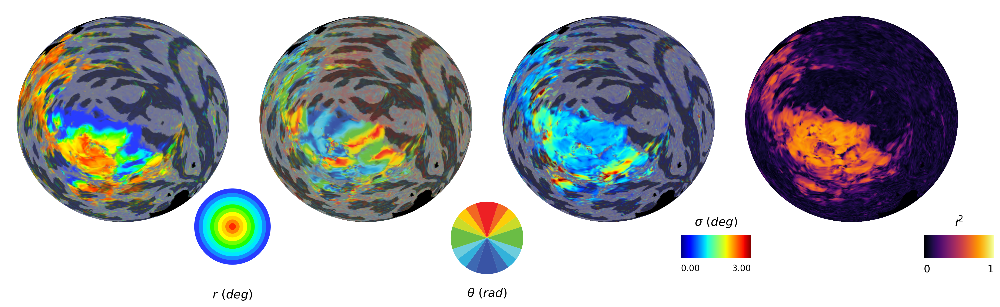

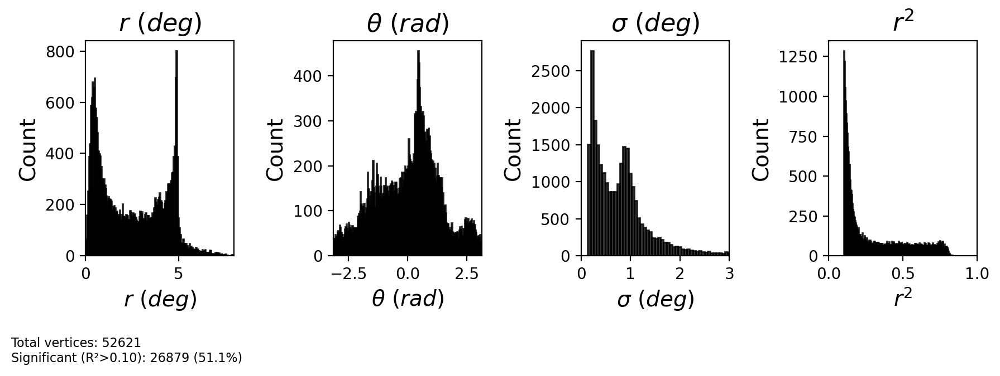

In [8]:
# Plot pRF maps for a single hemisphere
fig = plot_prf_maps(prf_results, flatmaps, colors_ecc, colors_polar, h, max_sigma=3, r2_threshold=0.15)
plt.show()


# Plot histogram of pRF parameters 
# Define x-limits for each parameter
xlims = [
    (0, 8),           # Eccentricity: 0 to 10 degrees
    (-np.pi, np.pi),   # Polar angle: -π to π
    (0, 3),           # Sigma: 0 to 5 degrees
    (0, 1)            # R²: 0 to 1
]

fig = plot_prf_histograms(x, y, sigma, r2, r2_threshold=0.1, xlims=xlims)
plt.show()

### Define   CF mapping variables

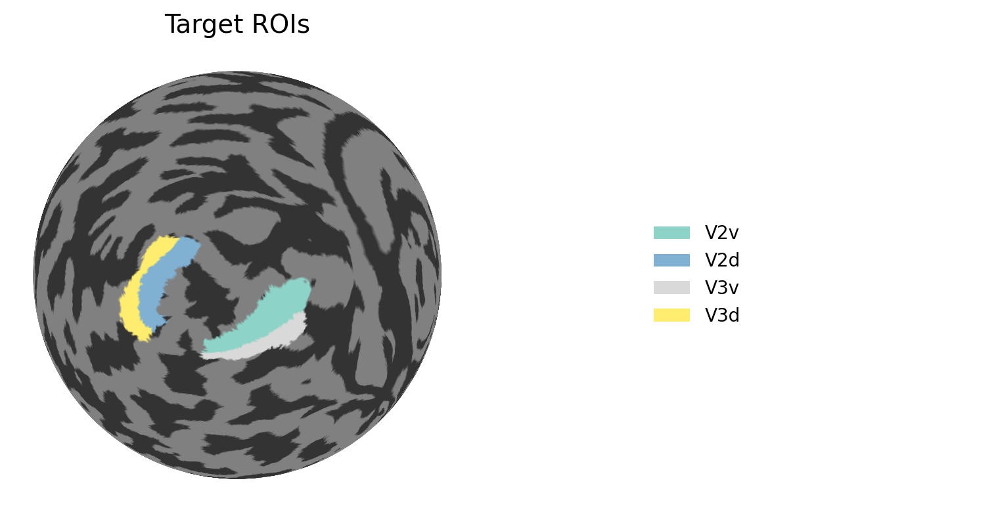

In [ ]:
# TARGET ROI:

target_rois = [
    "V2v", "V2d", "V3v", "V3d"
]

# Map ROI names to Wang15 atlas indices
roi_name_to_index = {
    "V1v": 1, "V1d": 2, "V2v": 3, "V2d": 4, "V3v": 5, "V3d": 6,
    "hV4": 7, "VO1": 8, "VO2": 9, "PHC1": 10, "PHC2": 11,
    "TO2": 12, "TO1": 13, "LO2": 14, "LO1": 15,
    "V3B": 16, "V3A": 17, "IPS0": 18, "IPS1": 19, "IPS2": 20,
    "IPS3": 21, "IPS4": 22, "IPS5": 23, "SPL1": 24, "FEF": 25
}

# Get indices for target ROIs
target_indices = [roi_name_to_index[roi] for roi in target_rois]

colmap = plt.cm.Set3
n_target_rois = len(target_rois)
roi_colors = colmap(np.linspace(0, 1, n_target_rois))



roi_color_dict = {roi: roi_colors[i] for i, roi in enumerate(target_rois)}

# Create ROI map with custom colors
roi_map = np.full(wang15_map[cortex_index].shape, np.nan)
roi_colors_array = np.full(wang15_map[cortex_index].shape, np.nan)

for i, (roi_name, roi_idx) in enumerate(zip(target_rois, target_indices)):
    mask = wang15_map[cortex_index] == roi_idx
    roi_map[mask] = i + 1  # Assign sequential numbers
    roi_colors_array[mask] = i

# Create mask for target ROIs only
target_roi_mask = np.isin(wang15_map[cortex_index], target_indices)

# Create figure with two subplots: one for the brain, one for the legend
fig = plt.figure(figsize=(10, 4), dpi=200)
gs = fig.add_gridspec(1, 2, width_ratios=[3, 1])

# Brain plot
ax_brain = fig.add_subplot(gs[0])
ny.cortex_plot(
    flatmaps[h], 
    axes=ax_brain,
    color=roi_colors_array,
    cmap=colmap,  
    mask=target_roi_mask,
    vmin=0,
    vmax=n_target_rois-1
)
ax_brain.set_aspect('equal')
ax_brain.set_title(f'Target ROIs', fontsize=14, pad=10)
ax_brain.axis('off')

# Legend
ax_legend = fig.add_subplot(gs[1])
legend_elements = [
    Patch(facecolor=roi_color_dict[roi], label=roi) 
    for roi in target_rois
]
ax_legend.legend(handles=legend_elements, loc='center left', frameon=False, fontsize=10)
ax_legend.set_axis_off()

plt.tight_layout()
plt.show()

### Isolate source ROI submesh

In [10]:
# SOURCE ROI:


# Select source ROI and mask  
roi_selection=[1]

#ecc_range=(0.75, 6.75)
ecc_range=(0, 6.5)



# Create mask for V1 (regions 0 and 1 in Wang atlas)
roi_mask = np.isin(wang15_map[cortex_index], [1, 2])  # V1v and V1d

## Use Benson eccentricity to narrow down the source ROI extent
param_mask = (benson_eccen > ecc_range[0]) & (benson_eccen < ecc_range[1])
pol_mask =  (benson_polar >= 35) & (benson_polar <= 135)
source_mask = roi_mask & param_mask & pol_mask


# Extract ROI submesh (and update vertex indices)
roi_submesh = flatmaps[h].submesh(source_mask)
roi_submesh.prop('index')
submesh_labels = roi_submesh.prop('label')
sub_source_mask = np.isin(flatmaps[h].labels, submesh_labels)



# Get the exact indices of your source vertices
source_indices = np.where(sub_source_mask)[0]
target_indices = np.where(target_roi_mask)[0]
print(f"Number of source vertices: {len(source_indices)}")
print(f"Number of target vertices: {len(target_indices)}")


Number of source vertices: 863
Number of target vertices: 2486


### Establish retinotopic coordinates within the source ROI (V1)

In order to use atlas-based retinotopy in the abscence of visual field mapping (*e.g.* in congenital blindness), we need to assess a number of questions. First, how do empirical and atlas based retinotopic map for the source ROI (V1) compare?

/home/nicolas-gravel/Documents/GitHubProjects/retMaps/retmap/pRF_processing.py:365: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


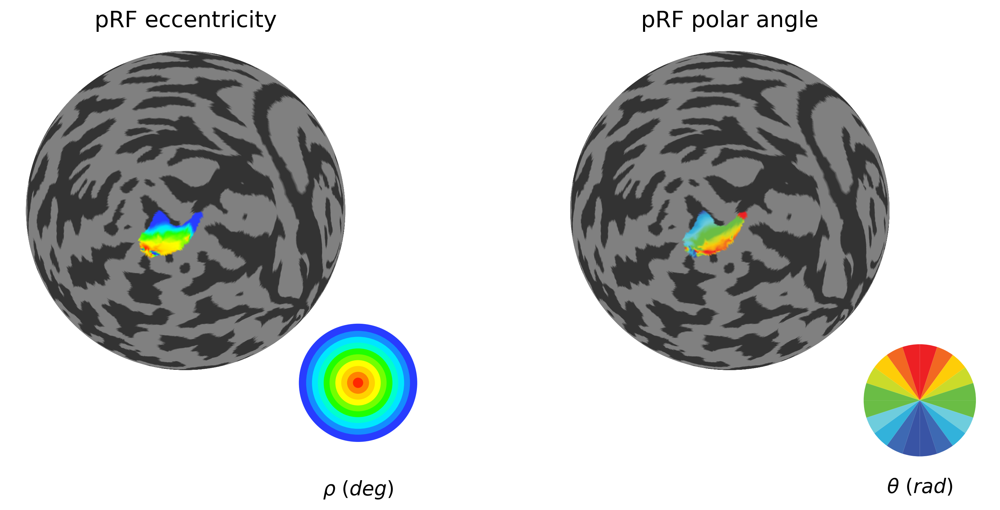

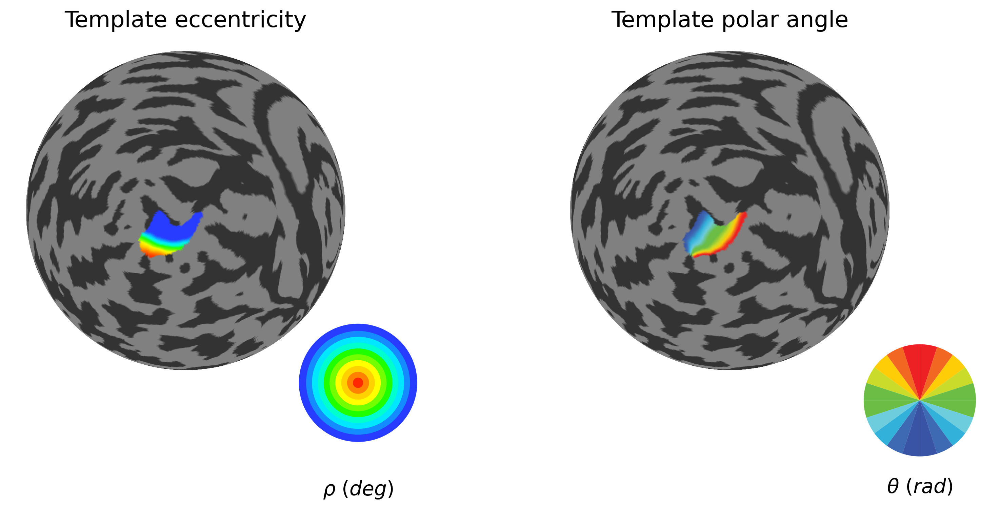


Pearson's rho (p-value) :  0.7483627504391225 ( 1.112482421514632e-155 )

Circular rho  (p-value) :  0.8231211731234961 ( 1.0776404524163543e-127 )


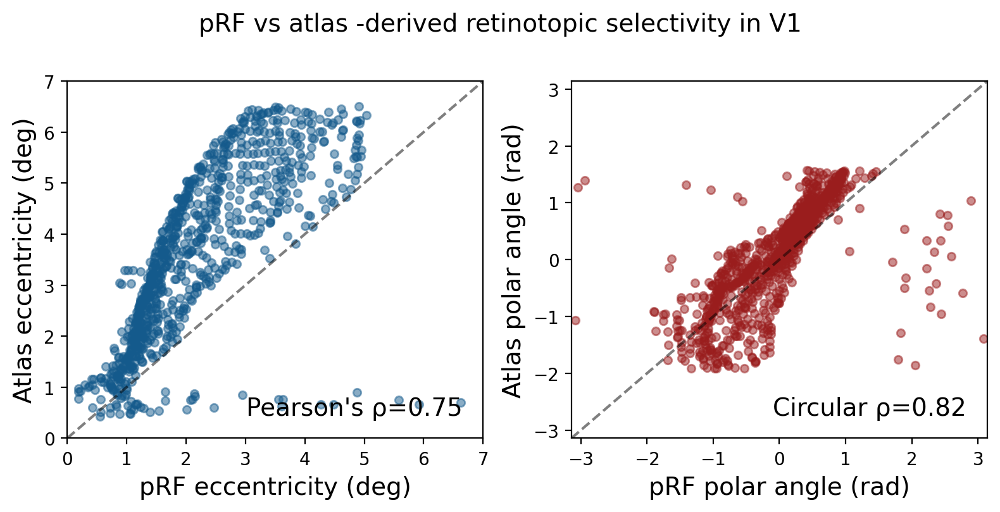

In [11]:
### V1 reference retinotopy from pRF mapping
plot_roi_retMap(ecc, polar, sub_source_mask, ['pRF eccentricity', 'pRF polar angle'], flatmaps, colors_ecc, colors_polar, h)

### V1 reference retinotopy from Benson atlas
plot_roi_retMap(benson_eccen, benson_polar, sub_source_mask, ['Template eccentricity', 'Template polar angle'], flatmaps, colors_ecc, colors_polar, h)


### How do empirical and atlas based retinotopic map for the source ROI (V1) compare?
mask = sub_source_mask

ecc_pRF = ecc[mask]
pol_pRF = polar[mask]
ecc_atlas = benson_eccen[mask] 
pol_atlas = np.deg2rad(benson_polar[mask] *2)-np.pi

# Compute circular correlation
corr_pol = circ_corrcl(pol_pRF, pol_atlas)
corr_pol_rho = corr_pol[0]
corr_pol_pval = corr_pol[1]

corr_ecc_rho, corr_ecc_pval = pearsonr(ecc_pRF, ecc_atlas)

print("\nPearson's rho (p-value) : ", corr_ecc_rho,'(',corr_ecc_pval,')')
print("\nCircular rho  (p-value) : ", corr_pol_rho, '(',corr_pol_pval,')')


# Scatter plots
fig, (ax_ecc, ax_pol) = plt.subplots(1, 2, figsize=(8, 4), dpi=200)

alpha = 0.5
scatter_size = 20

fig.suptitle(f'pRF vs atlas -derived retinotopic selectivity in V1', fontsize=14, y=1)

ecc_color = "#145A8C"  
pol_color = "#9A1D1D"  

# Eccentricity scatter plot
ax_ecc.scatter(ecc_pRF, ecc_atlas, alpha=alpha, s=scatter_size, c=ecc_color)
max_ecc = np.ceil(max(ecc_pRF.max(), ecc_atlas.max()))
ax_ecc.plot([0, max_ecc], [0, max_ecc], 'k--', alpha=0.5)
ax_ecc.set_xlim(0, max_ecc)
ax_ecc.set_ylim(0, max_ecc)
ax_ecc.set_xlabel('pRF eccentricity (deg)', fontsize=14)
ax_ecc.set_ylabel('Atlas eccentricity (deg)', fontsize=14)
ax_ecc.text(0.95, 0.05, f"Pearson's ρ={corr_ecc_rho:.2f}", 
            ha='right', va='bottom', fontsize=14, transform=ax_ecc.transAxes)

# Polar angle scatter plot
ax_pol.scatter(pol_pRF, pol_atlas, alpha=alpha, s=scatter_size, c=pol_color)
ax_pol.plot([-np.pi, np.pi], [-np.pi, np.pi], 'k--', alpha=0.5)
ax_pol.set_xlim(-np.pi, np.pi)
ax_pol.set_ylim(-np.pi, np.pi)
ax_pol.set_xlabel('pRF polar angle (rad)', fontsize=14)
ax_pol.set_ylabel('Atlas polar angle (rad)', fontsize=14)
ax_pol.text(0.95, 0.05, f"Circular ρ={corr_pol_rho:.2f}", 
            ha='right', va='bottom', fontsize=14, transform=ax_pol.transAxes)

plt.tight_layout()
plt.show()


### Obtaining a cortical distance matrix within the source ROI (V1)

This must be in millimeters of cortical distances and is typically obtained using the Dijkstra's algorithm for the shortest patch of connected vertices within a mesh. 

Distance matrix shape: (863, 863)


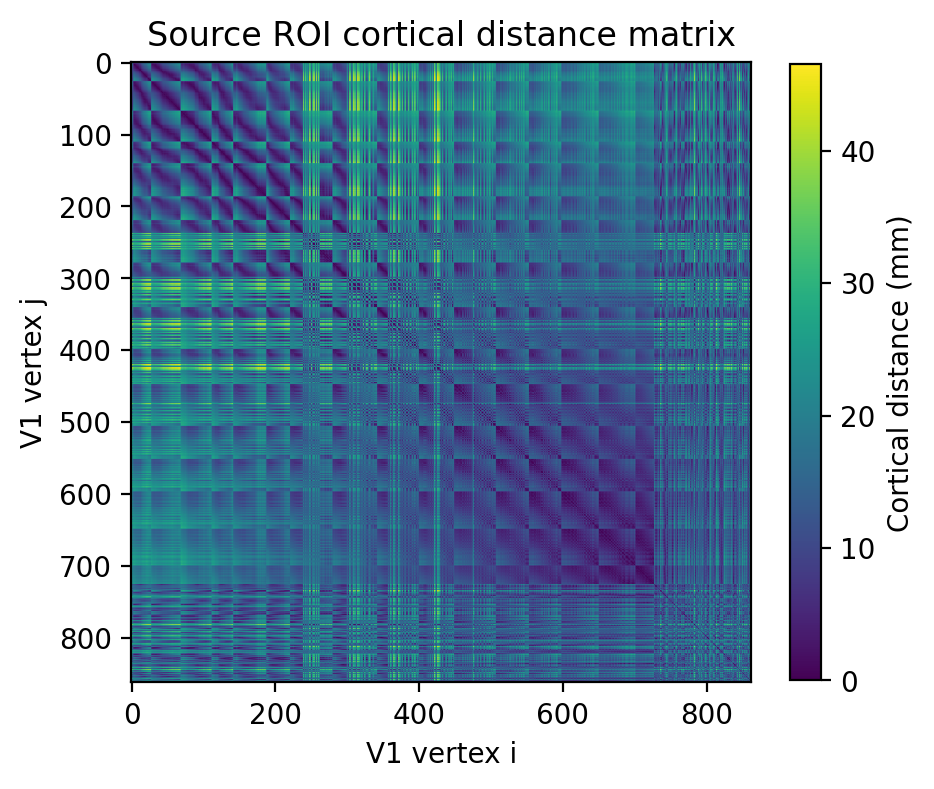

In [12]:
# Get cortical distance matrix for these specific vertices
roi_submesh = flatmaps[h].submesh(source_mask)
distance_matrix = roi_submesh.dijkstra(0,1)[0]
print(f"Distance matrix shape: {distance_matrix.shape}")


### Plot V1 cortical distance matrix
plt.figure(figsize=(5, 5), dpi=200)
im = plt.imshow(distance_matrix, aspect='equal', cmap='viridis')
plt.colorbar(im, label='Cortical distance (mm)', shrink=0.8)  # Shrunk colorbar height
plt.title('Source ROI cortical distance matrix')
plt.xlabel('V1 vertex i')
plt.ylabel('V1 vertex j')
plt.show()

### CF modelling!

In [13]:
ts_path = os.path.join(pRF_params_path, f'{h}_averaged_cleaned_zscored.npy')
time_series = np.nan_to_num(np.load(ts_path))
source_data = time_series[sub_source_mask]
#target_data = time_series[sub_target_mask]
target_data = time_series[target_roi_mask]
del time_series

print('\nSource data :', source_data.shape)
print('\nTarget data :', target_data.shape)

# Create stimulus with matching indices
roi_submesh = flatmaps[h].submesh(source_mask)
distance_matrix = roi_submesh.dijkstra(0,1)[0]

source_stim = CFStimulus(
    source_data,
    np.arange(len(source_data)),  # Use exact length of source data
    distance_matrix
)

print(f"Source data shape: {source_data.shape}")
print(f"Design matrix shape: {source_stim.design_matrix.shape}")

del distance_matrix

# Create model and fitter
model = CFGaussianModel(source_stim)
gf = CFFitter(data=target_data, model=model)


# Define search grid for Gaussian width (sigmas)
sigmas = np.linspace(0.5, 15, 20)
print(f"Number of elements: {len(sigmas)}")
print("\nSigma values :", sigmas)



Source data : (863, 150)

Target data : (2486, 150)
Source data shape: (863, 150)
Design matrix shape: (863, 150)
Number of elements: 20

Sigma values : [ 0.5         1.26315789  2.02631579  2.78947368  3.55263158  4.31578947
  5.07894737  5.84210526  6.60526316  7.36842105  8.13157895  8.89473684
  9.65789474 10.42105263 11.18421053 11.94736842 12.71052632 13.47368421
 14.23684211 15.        ]


### Model optimization

* Cortical distances for source ROI obtained from *sub-mesh*

* CF candidate sizes provided 

* Grid search implemented in `scikit-learn`

* Iterative search implemented as:
    - Linear minimization in `SciPy`
    - Gradient descent based on automatic differentiation (`tensorFlow`)  

* Input data dimensions (*vertices x time*):
    - source : 863, 150
    - target : 2486, 150
  

    1.- Powell, M J D. (1964). **An efficient method for finding the minimum of a function of several variables without calculating derivatives**. The Computer Journal 7: 155-162.

    2.- Powell M J D. (2007). **A view of algorithms for optimization without derivatives**. Cambridge University Technical Report DAMTP, 2007/NA03


### Grid fit using **least-squares** prediction optimization

Takes ~**35s** using `numpy` (implemented in `prfpy`).

In [14]:
# After running grid_fit
gf.grid_fit(sigmas, verbose=True, n_batches=100)

Each batch contains approx. 25 voxels.


[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:   11.1s
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   23.6s finished


### Iterative fit using **derivative-free** minimization

Takes ~**25s** using derivative-free linear minimization (*Powell* algorithm in `scipy`).


In [15]:
r2_threshold = 0.1

In [16]:
# Optimize using BFGS
optimized_results = optimize_connfield_dfree(
    gf,
    r2_threshold=r2_threshold,
    sigma_bounds=[(0.1, 20.0)],
    method='L-BFGS-B', #'COBYQA'
    tol=1e-5,
    verbose=True
)

Optimizing 2469 of 2486 sites (r2 >= 0.1)


Optimizing CFs: 100%|██████████| 2469/2469 [00:22<00:00, 111.96it/s]


Optimization complete!
Mean sigma change: 0.735 mm
Mean r2 improvement: -0.0008
Optimized sigma range: 0.10 - 20.00 mm


### Iterative fit using **automatic differentiation**


Depending on optimization parameters(learning rate, convergence threshold, batch size, etc), can take between **1m 18s** to **12s** (with `tensorflow`and `cuda` v.12.8 in an NVIDIA RTX 1000 Ada GPU). 

In [17]:
# Optimize using TensorFlow GPU
gradescent_results = optimize_connfield_gdescent(
    gf,
    r2_threshold=r2_threshold,
    sigma_bounds=(0.1, 20.0),
    learning_rate=0.01,  # Lower for stability
    max_iterations=10000,
    convergence_threshold=1e-5,
    batch_size=5000,  # Adjust based on GPU memory
    verbose=True
)

2025-10-12 14:59:04.272615: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-10-12 14:59:04.298378: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:10575] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-10-12 14:59:04.298408: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:479] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-10-12 14:59:04.299742: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1442] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-10-12 14:59:04.305202: I tensorflow/core/platform/cpu_feature_gua


TENSORFLOW GPU PARALLEL OPTIMIZATION
Optimizing 2469 of 2486 sites (r2 >= 0.1)
Batch size: 5000
GPU: /physical_device:GPU:0


GPU batches: 100%|██████████| 1/1 [00:05<00:00,  5.46s/it]



OPTIMIZATION COMPLETE

Sigma changes:
  Mean |Δσ|: 0.822 mm
  Max |Δσ|: 19.500 mm

R² improvements:
  Mean ΔR²: -0.0016
  Sites improved: 2323 (94.1%)


### Iterative alternating fit for **joint optimization** of CF size and position


GPU-PARALLELIZED ALTERNATING OPTIMIZATION
Optimizing 2469 of 2486 sites
Cycles: 20, Batch: 300
GPU: /physical_device:GPU:0
Max neighbors: 863, Search radius: 50 mm

--- Cycle 1/20 ---


Cycle 1:   0%|          | 0/9 [00:00<?, ?it/s]

Cycle 1: 100%|██████████| 9/9 [00:07<00:00,  1.20it/s]


  Improved: 2328/2469 sites (94.3%)
  Position changes: 2 sites (0.1%)
  Mean |Δσ|: 0.084 mm
  Mean R²: 0.5770
  Mean ΔR²: 0.0022

--- Cycle 2/20 ---


Cycle 2: 100%|██████████| 9/9 [00:04<00:00,  2.14it/s]


  Improved: 2066/2469 sites (83.7%)
  Position changes: 43 sites (1.7%)
  Mean |Δσ|: 0.021 mm
  Mean R²: 0.5777
  Mean ΔR²: 0.0006

--- Cycle 3/20 ---


Cycle 3: 100%|██████████| 9/9 [00:03<00:00,  2.57it/s]


  Improved: 1893/2469 sites (76.7%)
  Position changes: 13 sites (0.5%)
  Mean |Δσ|: 0.011 mm
  Mean R²: 0.5780
  Mean ΔR²: 0.0003

--- Cycle 4/20 ---


Cycle 4: 100%|██████████| 9/9 [00:03<00:00,  2.70it/s]


  Improved: 1753/2469 sites (71.0%)
  Position changes: 11 sites (0.4%)
  Mean |Δσ|: 0.009 mm
  Mean R²: 0.5782
  Mean ΔR²: 0.0003

--- Cycle 5/20 ---


Cycle 5: 100%|██████████| 9/9 [00:03<00:00,  2.63it/s]


  Improved: 1631/2469 sites (66.1%)
  Position changes: 5 sites (0.2%)
  Mean |Δσ|: 0.008 mm
  Mean R²: 0.5785
  Mean ΔR²: 0.0002

--- Cycle 6/20 ---


Cycle 6: 100%|██████████| 9/9 [00:03<00:00,  2.70it/s]


  Improved: 1522/2469 sites (61.6%)
  Position changes: 6 sites (0.2%)
  Mean |Δσ|: 0.007 mm
  Mean R²: 0.5787
  Mean ΔR²: 0.0002

--- Cycle 7/20 ---


Cycle 7: 100%|██████████| 9/9 [00:03<00:00,  2.55it/s]


  Improved: 1448/2469 sites (58.6%)
  Position changes: 4 sites (0.2%)
  Mean |Δσ|: 0.006 mm
  Mean R²: 0.5788
  Mean ΔR²: 0.0002

--- Cycle 8/20 ---


Cycle 8: 100%|██████████| 9/9 [00:03<00:00,  2.58it/s]


  Improved: 1388/2469 sites (56.2%)
  Position changes: 3 sites (0.1%)
  Mean |Δσ|: 0.005 mm
  Mean R²: 0.5790
  Mean ΔR²: 0.0002

--- Cycle 9/20 ---


Cycle 9: 100%|██████████| 9/9 [00:03<00:00,  2.56it/s]


  Improved: 1347/2469 sites (54.6%)
  Position changes: 6 sites (0.2%)
  Mean |Δσ|: 0.004 mm
  Mean R²: 0.5791
  Mean ΔR²: 0.0001

--- Cycle 10/20 ---


Cycle 10: 100%|██████████| 9/9 [00:03<00:00,  2.48it/s]


  Improved: 1297/2469 sites (52.5%)
  Position changes: 4 sites (0.2%)
  Mean |Δσ|: 0.004 mm
  Mean R²: 0.5793
  Mean ΔR²: 0.0001

--- Cycle 11/20 ---


Cycle 11: 100%|██████████| 9/9 [00:03<00:00,  2.58it/s]


  Improved: 1254/2469 sites (50.8%)
  Position changes: 3 sites (0.1%)
  Mean |Δσ|: 0.004 mm
  Mean R²: 0.5794
  Mean ΔR²: 0.0001

--- Cycle 12/20 ---


Cycle 12: 100%|██████████| 9/9 [00:03<00:00,  2.39it/s]


  Improved: 1220/2469 sites (49.4%)
  Position changes: 5 sites (0.2%)
  Mean |Δσ|: 0.003 mm
  Mean R²: 0.5795
  Mean ΔR²: 0.0001

--- Cycle 13/20 ---


Cycle 13: 100%|██████████| 9/9 [00:03<00:00,  2.55it/s]


  Improved: 1190/2469 sites (48.2%)
  Position changes: 7 sites (0.3%)
  Mean |Δσ|: 0.003 mm
  Mean R²: 0.5796
  Mean ΔR²: 0.0001

--- Cycle 14/20 ---


Cycle 14: 100%|██████████| 9/9 [00:03<00:00,  2.59it/s]


  Improved: 1165/2469 sites (47.2%)
  Position changes: 5 sites (0.2%)
  Mean |Δσ|: 0.003 mm
  Mean R²: 0.5797
  Mean ΔR²: 0.0001

--- Cycle 15/20 ---


Cycle 15: 100%|██████████| 9/9 [00:03<00:00,  2.53it/s]


  Improved: 1150/2469 sites (46.6%)
  Position changes: 3 sites (0.1%)
  Mean |Δσ|: 0.003 mm
  Mean R²: 0.5797
  Mean ΔR²: 0.0001

--- Cycle 16/20 ---


Cycle 16: 100%|██████████| 9/9 [00:03<00:00,  2.59it/s]


  Improved: 1134/2469 sites (45.9%)
  Position changes: 5 sites (0.2%)
  Mean |Δσ|: 0.002 mm
  Mean R²: 0.5798
  Mean ΔR²: 0.0001

--- Cycle 17/20 ---


Cycle 17: 100%|██████████| 9/9 [00:03<00:00,  2.44it/s]


  Improved: 1113/2469 sites (45.1%)
  Position changes: 1 sites (0.0%)
  Mean |Δσ|: 0.002 mm
  Mean R²: 0.5799
  Mean ΔR²: 0.0001

--- Cycle 18/20 ---


Cycle 18: 100%|██████████| 9/9 [00:03<00:00,  2.48it/s]


  Improved: 1101/2469 sites (44.6%)
  Position changes: 0 sites (0.0%)
  Mean |Δσ|: 0.002 mm
  Mean R²: 0.5799
  Mean ΔR²: 0.0001

--- Cycle 19/20 ---


Cycle 19: 100%|██████████| 9/9 [00:03<00:00,  2.51it/s]


  Improved: 1093/2469 sites (44.3%)
  Position changes: 3 sites (0.1%)
  Mean |Δσ|: 0.002 mm
  Mean R²: 0.5800
  Mean ΔR²: 0.0000

--- Cycle 20/20 ---


Cycle 20: 100%|██████████| 9/9 [00:03<00:00,  2.57it/s]


  Improved: 1079/2469 sites (43.7%)
  Position changes: 0 sites (0.0%)
  Mean |Δσ|: 0.002 mm
  Mean R²: 0.5800
  Mean ΔR²: 0.0000

FINAL RESULTS (from initial grid search)

Total position changes:
  Sites moved: 114 (4.6%)

Total sigma changes:
  Mean |Δσ|: 0.183 mm
  Median |Δσ|: 0.203 mm
  Max |Δσ|: 2.014 mm

Total R² improvements:
  Mean ΔR²: 0.0052
  Median ΔR²: 0.0016
  Sites improved: 2326 (94.2%)
  Mean final R²: 0.5800


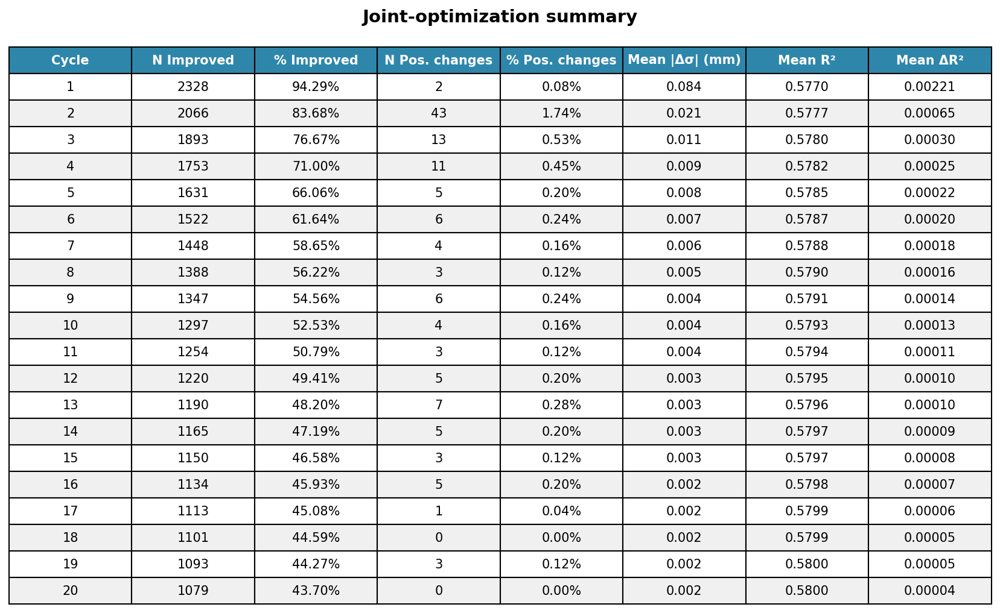

In [27]:
joint_optimization = optimize_connfield_joint(
    gf,
    r2_threshold=r2_threshold,
    sigma_bounds=(0.1, 20.0),
    max_outer_iterations=20,
    max_inner_iterations=5000,
    search_radius=50,
    batch_size=300,  
    learning_rate=0.001,
    verbose=True
)

cycle_stats = joint_optimization['cycle_statistics']


# Summary table
fig1 = plot_convergence_summary_table(cycle_stats)
plt.savefig('optimization_summary_table.png', dpi=300, bbox_inches='tight')
plt.show()

### How do different optimization strategies compare?

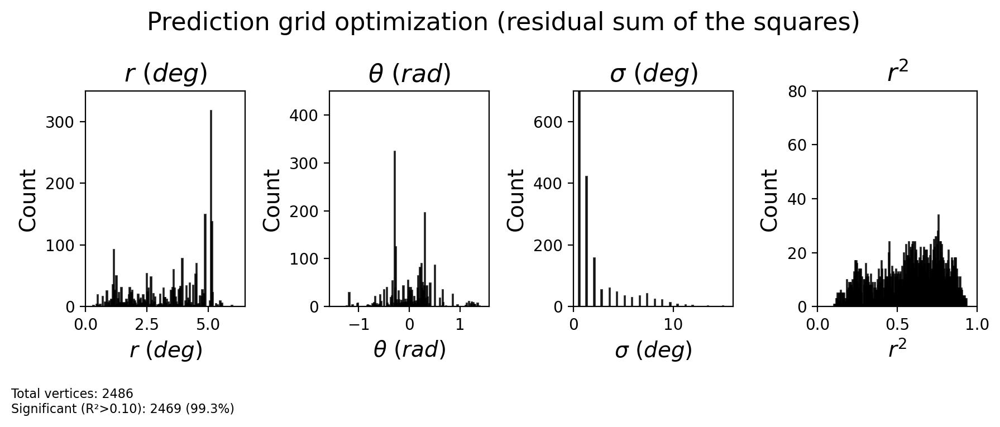

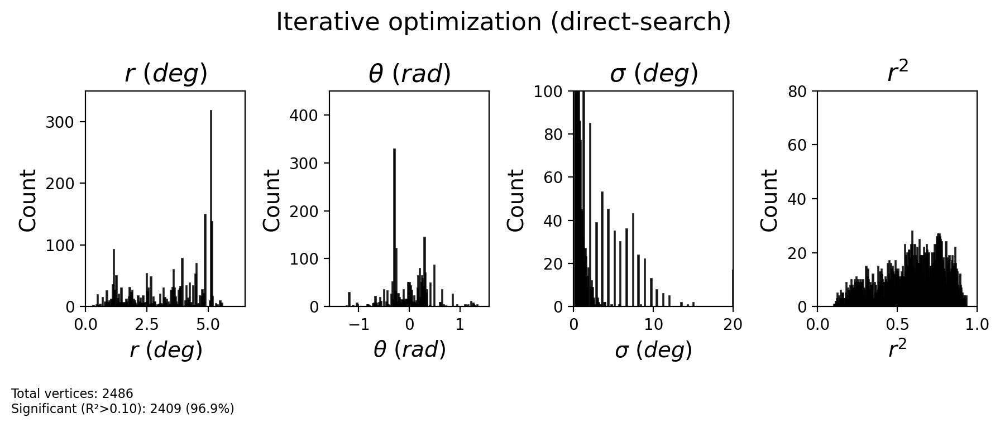

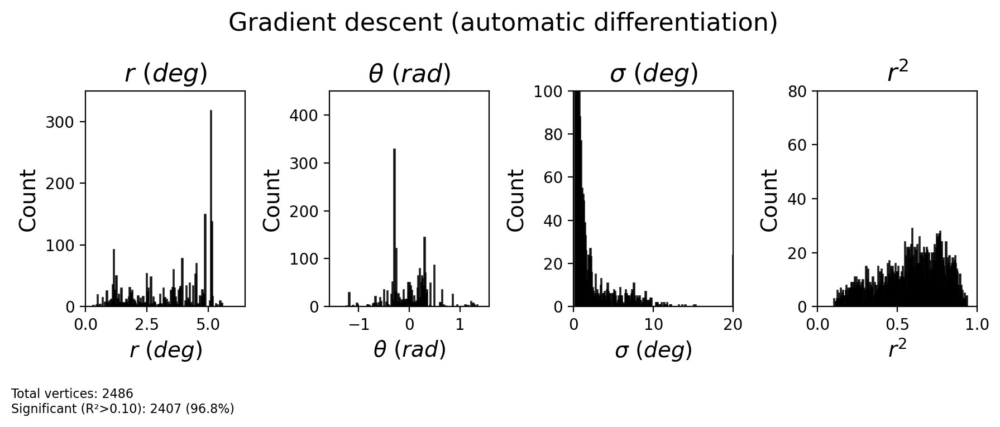

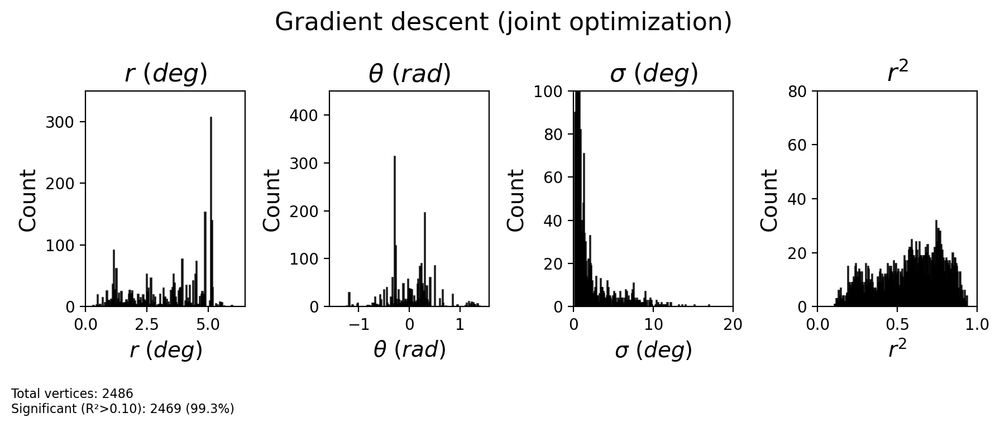

In [28]:
CF_centers_grid = gf.gridsearch_params[:, 0].astype(int)
CF_ecc_grid = ecc_pRF[CF_centers_grid]
CF_polar_grid = pol_pRF[CF_centers_grid]
sigma_grid = gf.gridsearch_params[:, 1]
rsq_grid = gf.gridsearch_r2

fig = plot_prf_histograms(
    CF_ecc_grid, CF_polar_grid, sigma_grid, rsq_grid,
    bins=[200, 200, 200, 200],
    ylims=[(0, 350), (0, 450), (0, 700), (0, 80)],
    xlims=[(ecc_range[0], ecc_range[1]), (-np.pi/2, np.pi/2), (0, 16), (0, 1)],
    r2_threshold=r2_threshold
)
plt.suptitle('Prediction grid optimization (residual sum of the squares)', fontsize=16, y=1.1)
plt.show()


# Extract optimized parameters
CF_centers_opt = optimized_results['vertex_indices'].astype(int)
sigma_opt = optimized_results['sigma']
r2_opt = optimized_results['r2']

# Get retinotopic properties of optimized CF centers
CF_ecc_opt = ecc_pRF[CF_centers_opt]
CF_polar_opt = pol_pRF[CF_centers_opt]


fig = plot_prf_histograms(
    CF_ecc_opt, CF_polar_opt, sigma_opt, r2_opt,
    bins=[200, 200, 200, 200],
    ylims=[(0, 350), (0, 450), (0, 100), (0, 80)],
    xlims=[(ecc_range[0], ecc_range[1]), (-np.pi/2, np.pi/2), (0, 20), (0, 1)],
    r2_threshold=r2_threshold
)
plt.suptitle('Iterative optimization (direct-search)', fontsize=16, y=1.1)
plt.show()


# Extract optimized parameters
CF_centers_opt = gradescent_results['vertex_indices'].astype(int)
sigma_opt = gradescent_results['sigma']
r2_opt = gradescent_results['r2']

# Get retinotopic properties of optimized CF centers
CF_ecc_opt = ecc_pRF[CF_centers_opt]
CF_polar_opt = pol_pRF[CF_centers_opt]

fig = plot_prf_histograms(
    CF_ecc_opt, CF_polar_opt, sigma_opt, r2_opt,
    bins=[200, 200, 200, 200],
    ylims=[(0, 350), (0, 450), (0, 100), (0, 80)],
    xlims=[(ecc_range[0], ecc_range[1]), (-np.pi/2, np.pi/2), (0, 20), (0, 1)],
    r2_threshold=r2_threshold
)
plt.suptitle('Gradient descent (automatic differentiation)', fontsize=16, y=1.1)
plt.show()


# Extract optimized parameters
CF_centers_opt = joint_optimization['vertex_indices'].astype(int)
sigma_opt = joint_optimization['sigma']
r2_opt = joint_optimization['r2']

# Get retinotopic properties of optimized CF centers
CF_ecc_opt = ecc_pRF[CF_centers_opt]
CF_polar_opt = pol_pRF[CF_centers_opt]

fig = plot_prf_histograms(
    CF_ecc_opt, CF_polar_opt, sigma_opt, r2_opt,
    bins=[200, 200, 200, 200],
    ylims=[(0, 350), (0, 450), (0, 100), (0, 80)],
    xlims=[(ecc_range[0], ecc_range[1]), (-np.pi/2, np.pi/2), (0, 20), (0, 1)],
    r2_threshold=r2_threshold
)
plt.suptitle('Gradient descent (joint optimization)', fontsize=16, y=1.1)
plt.show()

### Check CF maps

/home/nicolas-gravel/Documents/GitHubProjects/retMaps/retmap/CF_mapping.py:1019: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()



Optimization approach comparison

R² threshold: 0.1
Sites above threshold: 2409


Iterative search
Sigma range: 0.10 - 20.00 mm
Mean sigma: 1.60 mm
Mean R²: 0.5873


Joint optimization
Sigma range: 0.13 - 17.01 mm
Mean sigma: 1.50 mm
Mean R²: 0.5895

--- Improvements ---
Mean |Δσ|: 0.222 mm
Mean ΔR²: 0.0022
Median ΔR²: 0.0000
Sites with improved R²: 1272 (52.8%)


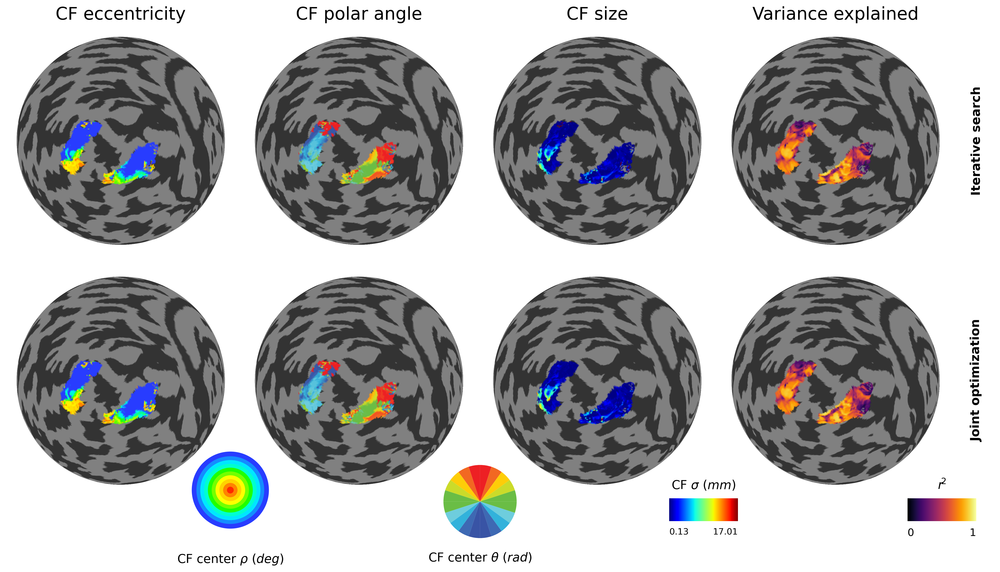

In [29]:
# Grid fit
results_A = {
    'centers': gf.gridsearch_params[:, 0].astype(int),
    'sigma': gf.gridsearch_params[:, 1],
    'r2': gf.gridsearch_r2,
    'opType' :'Grid search'
}

# Iterative fit
results_A = {
    'centers': optimized_results['vertex_indices'].astype(int),
    'sigma': optimized_results['sigma'],
    'r2': optimized_results['r2'],
    'opType' :'Iterative search'
}

# Gradient descent
results_X = {
    'centers': gradescent_results['vertex_indices'].astype(int),
    'sigma': gradescent_results['sigma'],
    'r2': gradescent_results['r2'],
    'opType' :'Gradient descent'
}


# Joint-optimization 
results_B = {
    'centers': joint_optimization['vertex_indices'].astype(int),
    'sigma': joint_optimization['sigma'],
    'r2': joint_optimization['r2'],
    'opType' :'Joint optimization'
}




# Compare results
fig = compare_cf_results(
    results_A=results_A,
    results_B=results_B,
    ecc_pRF=ecc_pRF,
    pol_pRF=pol_pRF,
    target_roi_mask=target_roi_mask,
    flatmaps=flatmaps,
    colors_ecc=colors_ecc,
    colors_polar=colors_polar,
    h=h,
    r2_threshold=r2_threshold,
    ecc_div=2
)
plt.show()

### Run-to-run reliability tests 


Eccentricity - Pearson's ρ: 0.797 (p=0.00e+00)
Polar angle - Circular ρ: 0.515 (p=1.23e-143)


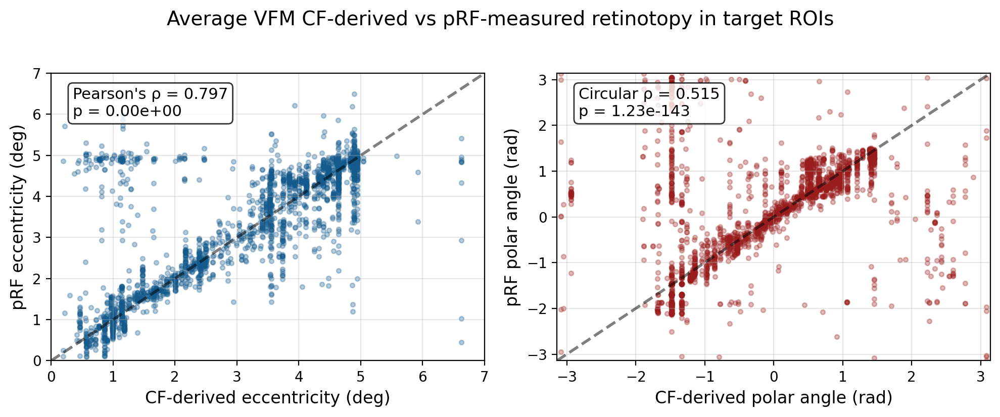

In [35]:
# Get CF results for target ROI

results_B = {
    'centers': joint_optimization['vertex_indices'].astype(int),
    'sigma': joint_optimization['sigma'],
    'r2': joint_optimization['r2'],
    'opType' :'Joint optimization'
}


mask = target_roi_mask

# CF-derived retinotopy (from source ROI centers)
CF_ecc = ecc_pRF[results_B['centers'].astype(int)]
CF_pol = pol_pRF[results_B['centers'].astype(int)]

# Direct pRF measurements in target ROI
target_ecc = ecc[mask]
target_pol = polar[mask]

# Compute correlations
corr_ecc_rho, corr_ecc_pval = pearsonr(CF_ecc, target_ecc)
corr_pol = circ_corrcl(CF_pol, target_pol)
corr_pol_rho = corr_pol[0]
corr_pol_pval = corr_pol[1]

print(f"\nEccentricity - Pearson's ρ: {corr_ecc_rho:.3f} (p={corr_ecc_pval:.2e})")
print(f"Polar angle - Circular ρ: {corr_pol_rho:.3f} (p={corr_pol_pval:.2e})")

# Scatter plots
fig, (ax_ecc, ax_pol) = plt.subplots(1, 2, figsize=(10, 4), dpi=200)

alpha = 0.3
scatter_size = 10

fig.suptitle('Average VFM CF-derived vs pRF-measured retinotopy in target ROIs', fontsize=14, y=1.02)

ecc_color = "#145A8C"  
pol_color = "#9A1D1D"  

# Eccentricity
ax_ecc.scatter(CF_ecc, target_ecc, alpha=alpha, s=scatter_size, c=ecc_color)
max_ecc = np.ceil(max(CF_ecc.max(), target_ecc.max()))
ax_ecc.plot([0, max_ecc], [0, max_ecc], 'k--', alpha=0.5, linewidth=2)
ax_ecc.set_xlim(0, max_ecc)
ax_ecc.set_ylim(0, max_ecc)
ax_ecc.set_xlabel('CF-derived eccentricity (deg)', fontsize=12)
ax_ecc.set_ylabel('pRF eccentricity (deg)', fontsize=12)
ax_ecc.text(0.05, 0.95, f"Pearson's ρ = {corr_ecc_rho:.3f}\np = {corr_ecc_pval:.2e}", 
            ha='left', va='top', fontsize=11, transform=ax_ecc.transAxes,
            bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
ax_ecc.grid(True, alpha=0.3)

# Polar angle
ax_pol.scatter(CF_pol, target_pol, alpha=alpha, s=scatter_size, c=pol_color)
ax_pol.plot([-np.pi, np.pi], [-np.pi, np.pi], 'k--', alpha=0.5, linewidth=2)
ax_pol.set_xlim(-np.pi, np.pi)
ax_pol.set_ylim(-np.pi, np.pi)
ax_pol.set_xlabel('CF-derived polar angle (rad)', fontsize=12)
ax_pol.set_ylabel('pRF polar angle (rad)', fontsize=12)
ax_pol.text(0.05, 0.95, f"Circular ρ = {corr_pol_rho:.3f}\np = {corr_pol_pval:.2e}", 
            ha='left', va='top', fontsize=11, transform=ax_pol.transAxes,
            bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
ax_pol.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

In [50]:
# Load all runs and compute CF for each
run_results = {}

for run_num in range(1, 5):
    print(f"\n{'='*60}")
    print(f"Processing Run {run_num}")
    print(f"{'='*60}")
    
    # Load run data
    ts_path = os.path.join(pRF_params_path, f'{h}_run_{run_num}_cleaned_zscored.npy')
    time_series = np.nan_to_num(np.load(ts_path))
    source_data = time_series[sub_source_mask]
    target_data = time_series[target_roi_mask]
    del time_series
    
    # Create stimulus and model
    roi_submesh = flatmaps[h].submesh(source_mask)
    distance_matrix = roi_submesh.dijkstra(0,1)[0]
    source_stim = CFStimulus(source_data, np.arange(len(source_data)), distance_matrix)
    model = CFGaussianModel(source_stim)
    gf = CFFitter(data=target_data, model=model)
    del distance_matrix
    
    # Grid fit
    sigmas = np.linspace(0.5, 15, 20)
    gf.grid_fit(sigmas, verbose=False, n_batches=100)
    
    # Joint optimization
    joint_opt = optimize_connfield_joint(
        gf,
        r2_threshold=r2_threshold,
        sigma_bounds=(0.1, 20.0),
        max_outer_iterations=10,
        search_radius=50,
        batch_size=300,
        learning_rate=0.001,
        verbose=False
    )
    
    # Store results
    run_results[f'run_{run_num}'] = {
        'centers': joint_opt['vertex_indices'].astype(int),
        'sigma': joint_opt['sigma'],
        'r2': joint_opt['r2']
    }
    
    print(f"Run {run_num} complete")




Processing Run 1
Run 1 complete

Processing Run 2
Run 2 complete

Processing Run 3
Run 3 complete

Processing Run 4
Run 4 complete


### Correlations between CF and pRF visual field selectivity maps 

In [59]:
# Collect statistics for all runs
stats_data = []
all_corr_ecc = []
all_corr_pol = []
all_sigma = []
all_r2 = []

for run_num in range(1, 5):
    results = run_results[f'run_{run_num}']
    
    # Get CF results for target ROI
    mask = target_roi_mask
    CF_ecc = ecc_pRF[results['centers'].astype(int)]
    CF_pol = pol_pRF[results['centers'].astype(int)]
    target_ecc = ecc[mask]
    target_pol = polar[mask]
    
    # Compute correlations
    corr_ecc_rho, corr_ecc_pval = pearsonr(CF_ecc, target_ecc)
    corr_pol = circ_corrcl(CF_pol, target_pol)
    corr_pol_rho = corr_pol[0]
    corr_pol_pval = corr_pol[1]
    
    # Get average sigma and mean R²
    mean_sigma = results['sigma'].mean()
    mean_r2 = results['r2'].mean()
    
    # Store for across-run statistics
    all_corr_ecc.append(corr_ecc_rho)
    all_corr_pol.append(corr_pol_rho)
    all_sigma.append(mean_sigma)
    all_r2.append(mean_r2)
    
    stats_data.append({
        'Run': f"Run {run_num}",
        'Ecc ρ': f"{corr_ecc_rho:.3f}",
        'Ecc p': f"{corr_ecc_pval:.2e}",
        'Pol ρ': f"{corr_pol_rho:.3f}",
        'Pol p': f"{corr_pol_pval:.2e}",
        'Mean σ (mm)': f"{mean_sigma:.2f}",
        'Mean R²': f"{mean_r2:.4f}"
    })

# Add run average with std
stats_data.append({
    'Run': 'Runs Mean (std)',
    'Ecc ρ': f"{np.mean(all_corr_ecc):.3f} ({np.std(all_corr_ecc):.3f})",
    'Ecc p': '-',
    'Pol ρ': f"{np.mean(all_corr_pol):.3f} ({np.std(all_corr_pol):.3f})",
    'Pol p': '-',
    'Mean σ (mm)': f"{np.mean(all_sigma):.2f} ({np.std(all_sigma):.2f})",
    'Mean R²': f"{np.mean(all_r2):.4f} ({np.std(all_r2):.4f})"
})

# Add averaged timeseries result (results_B)
mask = target_roi_mask
CF_ecc_avg = ecc_pRF[results_B['centers'].astype(int)]
CF_pol_avg = pol_pRF[results_B['centers'].astype(int)]

#CF_ecc_avg = ecc_atlas[results_B['centers'].astype(int)]
#CF_pol_avg = pol_atlas[results_B['centers'].astype(int)]

target_ecc_avg = ecc[mask]
target_pol_avg = polar[mask]

corr_ecc_avg_rho, corr_ecc_avg_pval = pearsonr(CF_ecc_avg, target_ecc_avg)
corr_pol_avg = circ_corrcl(CF_pol_avg, target_pol_avg)
corr_pol_avg_rho = corr_pol_avg[0]
corr_pol_avg_pval = corr_pol_avg[1]

mean_sigma_avg = results_B['sigma'].mean()
mean_r2_avg = results_B['r2'].mean()

stats_data.append({
    'Run': 'Averaged runs',
    'Ecc ρ': f"{corr_ecc_avg_rho:.3f}",
    'Ecc p': f"{corr_ecc_avg_pval:.2e}",
    'Pol ρ': f"{corr_pol_avg_rho:.3f}",
    'Pol p': f"{corr_pol_avg_pval:.2e}",
    'Mean σ (mm)': f"{mean_sigma_avg:.2f}",
    'Mean R²': f"{mean_r2_avg:.4f}"
})

# Create DataFrame
df_stats = pd.DataFrame(stats_data)

# Print as markdown table
print("\n## CF-derived vs pRF retinotopy")
print("\n" + df_stats.to_markdown(index=False))

# Also save to file
with open('cf_statistics_summary.md', 'w') as f:
    f.write("## CF-derived vs pRF retinotopy\n\n")
    f.write(df_stats.to_markdown(index=False))

print("\nTable saved to 'cf_statistics_summary.md'")


## CF-derived vs pRF retinotopy

| Run             | Ecc ρ         | Ecc p    | Pol ρ         | Pol p     | Mean σ (mm)   | Mean R²         |
|:----------------|:--------------|:---------|:--------------|:----------|:--------------|:----------------|
| Run 1           | 0.859         | 0.00e+00 | 0.537         | 2.06e-156 | 1.64          | 0.5003          |
| Run 2           | 0.802         | 0.00e+00 | 0.464         | 4.51e-117 | 1.49          | 0.4780          |
| Run 3           | 0.720         | 0.00e+00 | 0.456         | 5.93e-113 | 1.41          | 0.4828          |
| Run 4           | 0.687         | 0.00e+00 | 0.470         | 3.73e-120 | 1.70          | 0.4983          |
| Runs Mean (std) | 0.767 (0.067) | -        | 0.482 (0.032) | -         | 1.56 (0.12)   | 0.4898 (0.0096) |
| Averaged runs   | 0.797         | 0.00e+00 | 0.515         | 1.23e-143 | 1.48          | 0.5766          |

Table saved to 'cf_statistics_summary.md'


### CF match to atlas retinotopy

In [61]:
# Collect statistics for all runs
stats_data = []
all_corr_ecc = []
all_corr_pol = []
all_sigma = []
all_r2 = []

for run_num in range(1, 5):
    results = run_results[f'run_{run_num}']
    
    # Get CF results for target ROI
    mask = target_roi_mask
    CF_ecc = ecc_atlas[results['centers'].astype(int)]
    CF_pol = pol_atlas[results['centers'].astype(int)]
    target_ecc = ecc[mask]
    target_pol = polar[mask]
    
    # Compute correlations
    corr_ecc_rho, corr_ecc_pval = pearsonr(CF_ecc, target_ecc)
    corr_pol = circ_corrcl(CF_pol, target_pol)
    corr_pol_rho = corr_pol[0]
    corr_pol_pval = corr_pol[1]
    
    # Get average sigma and mean R²
    mean_sigma = results['sigma'].mean()
    mean_r2 = results['r2'].mean()
    
    # Store for across-run statistics
    all_corr_ecc.append(corr_ecc_rho)
    all_corr_pol.append(corr_pol_rho)
    all_sigma.append(mean_sigma)
    all_r2.append(mean_r2)
    
    stats_data.append({
        'Run': f"Run {run_num}",
        'Ecc ρ': f"{corr_ecc_rho:.3f}",
        'Ecc p': f"{corr_ecc_pval:.2e}",
        'Pol ρ': f"{corr_pol_rho:.3f}",
        'Pol p': f"{corr_pol_pval:.2e}",
        'Mean σ (mm)': f"{mean_sigma:.2f}",
        'Mean R²': f"{mean_r2:.4f}"
    })

# Add run average with std
stats_data.append({
    'Run': 'Runs Mean (std)',
    'Ecc ρ': f"{np.mean(all_corr_ecc):.3f} ({np.std(all_corr_ecc):.3f})",
    'Ecc p': '-',
    'Pol ρ': f"{np.mean(all_corr_pol):.3f} ({np.std(all_corr_pol):.3f})",
    'Pol p': '-',
    'Mean σ (mm)': f"{np.mean(all_sigma):.2f} ({np.std(all_sigma):.2f})",
    'Mean R²': f"{np.mean(all_r2):.4f} ({np.std(all_r2):.4f})"
})

# Add averaged timeseries result (results_B)
mask = target_roi_mask



CF_ecc_avg = ecc_atlas[results_B['centers'].astype(int)]
CF_pol_avg = pol_atlas[results_B['centers'].astype(int)]

target_ecc_avg = ecc[mask]
target_pol_avg = polar[mask]

corr_ecc_avg_rho, corr_ecc_avg_pval = pearsonr(CF_ecc_avg, target_ecc_avg)
corr_pol_avg = circ_corrcl(CF_pol_avg, target_pol_avg)
corr_pol_avg_rho = corr_pol_avg[0]
corr_pol_avg_pval = corr_pol_avg[1]

mean_sigma_avg = results_B['sigma'].mean()
mean_r2_avg = results_B['r2'].mean()

stats_data.append({
    'Run': 'Averaged runs',
    'Ecc ρ': f"{corr_ecc_avg_rho:.3f}",
    'Ecc p': f"{corr_ecc_avg_pval:.2e}",
    'Pol ρ': f"{corr_pol_avg_rho:.3f}",
    'Pol p': f"{corr_pol_avg_pval:.2e}",
    'Mean σ (mm)': f"{mean_sigma_avg:.2f}",
    'Mean R²': f"{mean_r2_avg:.4f}"
})

# Create DataFrame
df_stats = pd.DataFrame(stats_data)

# Print as markdown table
print("\n## CF-derived vs atlas retinotopy")
print("\n" + df_stats.to_markdown(index=False))

# Also save to file
with open('cf_statistics_summary.md', 'w') as f:
    f.write("## CF-derived vs pRF retinotopy\n\n")
    f.write(df_stats.to_markdown(index=False))

print("\nTable saved to 'cf_statistics_summary.md'")


## CF-derived vs atlas retinotopy

| Run             | Ecc ρ         | Ecc p     | Pol ρ         | Pol p     | Mean σ (mm)   | Mean R²         |
|:----------------|:--------------|:----------|:--------------|:----------|:--------------|:----------------|
| Run 1           | 0.777         | 0.00e+00  | 0.531         | 3.45e-153 | 1.64          | 0.5003          |
| Run 2           | 0.674         | 0.00e+00  | 0.489         | 8.06e-130 | 1.49          | 0.4780          |
| Run 3           | 0.594         | 6.24e-237 | 0.491         | 5.52e-131 | 1.41          | 0.4828          |
| Run 4           | 0.543         | 4.83e-191 | 0.457         | 1.55e-113 | 1.70          | 0.4983          |
| Runs Mean (std) | 0.647 (0.088) | -         | 0.492 (0.026) | -         | 1.56 (0.12)   | 0.4898 (0.0096) |
| Averaged runs   | 0.659         | 2.16e-309 | 0.527         | 1.20e-150 | 1.48          | 0.5766          |

Table saved to 'cf_statistics_summary.md'


## Conclusions


* Derivative free CF size refinement after `prfpy` grid fit, either using L-BFGS-B or Powell algorithms in `scipy`, comparable to bounded optimization by quadratic approximation (COBYQA), but nos as efficient as (optionally GPU parallelized) gradient descent in `tensorFlow`.

* Best strategy is to use `prfpy` grid fit, followed by a gradient descent -powered joint optimization of CF size and position (using `tensorFlow`). 

